## Downloading the necessary libraries

In [1]:
from onedrivedownloader import download
import os
import gdown
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from torch.nn import functional as F
from sklearn.neighbors import NearestNeighbors
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm  
import matplotlib.image as mpimg
from torch.utils.data import DataLoader
from torchvision import datasets
from sklearn.metrics.pairwise import cosine_similarity
from zipfile import ZipFile

## Loading test and base datasets

The **base dataset** was created for the purposes of the study, comprising 225 images divided into 5 classes (subfolders in the main folder). These classes were defined as follows: "Kitchen", "Living room", "Bathroom", "Bedroom" and "Wardrobe". A similar structure was used to create the **test dataset**, containing a total of 25 images, with 5 images for each class. 

Images from the **test dataset** were used for comparison with images from the **base dataset**.

In [2]:
# Downloading archived folders from Google drive
cache_url = 'https://drive.google.com/uc?id=1peD5neNa4kqo-XUcH5BkDMt4bKWXFTQ6'
test_url = 'https://drive.google.com/uc?id=1BT_HGVC__Q8oldWUW0wQnphyY8Egisnl'

output_cache = 'cache.zip'
output_test = 'tests.zip'

# Download and extract function
def download_and_extract(url, output_file, folder_name):
    if os.path.isdir(folder_name):
        print(f"{folder_name} folder already exists!")
    else:
        print(f"Downloading the {folder_name} folder")
        gdown.download(url, filename=output_file, quiet=False)
        with ZipFile(output_file, 'r') as zip_ref:
            zip_ref.extractall("./")
        print(f"{folder_name} folder downloaded and extracted successfully.")

download_and_extract(cache_url, output_cache, "cache")
download_and_extract(test_url, output_test, "tests")

cache folder already exists!
tests folder already exists!


## Image processing from the base and test datasets

In [3]:
# Setting the size оf images
target_size = (1024, 768)

# Converting images to tensors
transform = transforms.Compose([
    transforms.Resize(target_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [4]:
# Creating directories where the preprocessed images will be stored
base_directory = 'prep_base_imgs' # base folder
test_directory = 'prep_test_imgs' # test folder

# Paths to folders with raw images
base_path = os.path.join('cache', 'cache', 'imgs', 'indoor')
test_path = os.path.join('tests')

# Subfolders in both base and test folders. In our case, the names of the subfolders serve as the names of the classes.
folders = ['Kitchen', 'Living_room', 'Bathroom', 'Bedroom', 'Wardrobe']

# Check if the folder exists and create it if it doesn't
def create_directory(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)
        print(f"Directory '{directory}' created.")
    else:
        print(f"Directory '{directory}' already exists.")

    # The same foк subfolders
    for folder in folders:
        folder_path = os.path.join(directory, folder)
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
            print(f"Subdirectory '{folder_path}' created.")
        else:
            print(f"Subdirectory '{folder_path}' already exists.")

# Try to creat the directories
create_directory(base_directory)
create_directory(test_directory)

def prepare_image(image_path, folder, save_directory):
    image_name, ext = os.path.splitext(os.path.basename(image_path))
    # Check the file extension
    if ext.lower() not in ['.jpg', '.jpeg', '.JPG', '.png']:
        print(f"Ignoring file {image_name}{ext} as it has an unsupported extension.")
        return None
    
    # Create a folder for the image if it doesn't exist.
    folder_directory = os.path.join(save_directory, folder)
    os.makedirs(folder_directory, exist_ok=True)
    
    image = Image.open(image_path)
    
    # Get image sizes
    w, h = image.size
    
    # Resizing the image to the needed aspect ratio
    if h / w > target_size[1] / target_size[0]:
        h = int(w * target_size[1] / target_size[0])
    else:
        w = int(h * target_size[0] / target_size[1])

    # Image size conversion
    image = image.resize((w, h), resample=Image.BICUBIC)

    # Converting images to tensors
    transformed_image = transforms.ToTensor()(image)
    new_image_path = os.path.join(folder_directory, f"pr_{image_name}{ext}") # Renaming images
    
    try:
        transformed_image = transforms.ToPILImage()(transformed_image)  # Converting the tensors back to the images
        transformed_image.save(new_image_path)
        print(f"{image_name}{ext} from {folder} transformed to size {target_size} and saved as pr_{image_name}{ext} in {folder_directory}")
    except Exception as e:
        print(f"Error saving {image_name}{ext}: {e}")
        return None
    
    return transformed_image

# Loading and processing of images from base dataset
for folder in folders:
    folder_path = os.path.join(base_path, folder)
    if os.path.isdir(folder_path):
        print(f"Processing base images in folder {folder}...")
        for file in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file)
            prepare_image(file_path, folder, base_directory)
    else:
        print(f"Base folder {folder} not found")

# Loading and processing of images from base dataset
for folder in folders:
    folder_path = os.path.join(test_path, folder)
    if os.path.isdir(folder_path):
        print(f"Processing test images in folder {folder}...")
        for file in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file)
            prepare_image(file_path, folder, test_directory)
    else:
        print(f"Test folder {folder} not found")

Directory 'prep_base_imgs' already exists.
Subdirectory 'prep_base_imgs\Kitchen' already exists.
Subdirectory 'prep_base_imgs\Living_room' already exists.
Subdirectory 'prep_base_imgs\Bathroom' already exists.
Subdirectory 'prep_base_imgs\Bedroom' already exists.
Subdirectory 'prep_base_imgs\Wardrobe' already exists.
Directory 'prep_test_imgs' already exists.
Subdirectory 'prep_test_imgs\Kitchen' already exists.
Subdirectory 'prep_test_imgs\Living_room' already exists.
Subdirectory 'prep_test_imgs\Bathroom' already exists.
Subdirectory 'prep_test_imgs\Bedroom' already exists.
Subdirectory 'prep_test_imgs\Wardrobe' already exists.
Processing base images in folder Kitchen...
kitchen1.JPG from Kitchen transformed to size (1024, 768) and saved as pr_kitchen1.JPG in prep_base_imgs\Kitchen
kitchen10.jpg from Kitchen transformed to size (1024, 768) and saved as pr_kitchen10.jpg in prep_base_imgs\Kitchen
kitchen11.jpg from Kitchen transformed to size (1024, 768) and saved as pr_kitchen11.jpg i

In [5]:
path_to_base_images = './prep_base_imgs' # path to prepared base dataset
path_to_test_images = './prep_test_imgs' # path to prepared test dataset

# Сheck the number of images in each subfolder
for folder in folders:
    folder_path = os.path.join(path_to_base_images, folder)
    #folder_test_path = os.path.join(path_to_test_images, folder)
    if os.path.isdir(folder_path):
        files = os.listdir(folder_path)
        #files_test = os.listdir(folder_test_path)
        num_images = len(files)
        #num_test_images = len(folder_test_path)
        print(f"The number of images in the subfolder *{folder}* of the base folder: {num_images}")
        #print(f"The number of images in the subfolder {folder} of the test folder': {num_test_images}")
    else:
        print(f"Subfolder '{folder}' not found in the base folder.")
        #print(f"Subfolder '{folder}' not found in the test folder.")

The number of images in the subfolder *Kitchen* of the base folder: 46
The number of images in the subfolder *Living_room* of the base folder: 45
The number of images in the subfolder *Bathroom* of the base folder: 45
The number of images in the subfolder *Bedroom* of the base folder: 45
The number of images in the subfolder *Wardrobe* of the base folder: 45


In [6]:
# Check which subfolders exist in the folder (in case we have extra ones)
base_directory = 'prep_base_imgs'
expected_folders = {'Bathroom', 'Bedroom', 'Kitchen', 'Living_room', 'Wardrobe'}

# Getting a list of folders in the base folder
base_folders = os.listdir(base_directory)
extra_folders = set(base_folders) - expected_folders

if extra_folders:
    print("There's an extra folder, but that's okay.")
else:
    print("Cool, there is no extra one.")

# Display the list of folders
print("Folders in base directory:")
print(base_folders)

There's an extra folder, but that's okay.
Folders in base directory:
['.ipynb_checkpoints', 'Bathroom', 'Bedroom', 'Kitchen', 'Living_room', 'Wardrobe']


In [7]:
# Collect paths to images in each folder
def collect_image_paths(base_path, folders):
    categories_images = {}
    for folder in folders:
        folder_path = os.path.join(base_path, folder)
        if os.path.isdir(folder_path):
            image_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path)]
            categories_images[folder] = image_paths
    return categories_images

# Collect the paths to the images in the base and test folders
categories_images = collect_image_paths(path_to_base_images, folders)
test_categories_images = collect_image_paths(path_to_test_images, folders)

./prep_base_imgs\Kitchen\pr_kitchen1.JPG


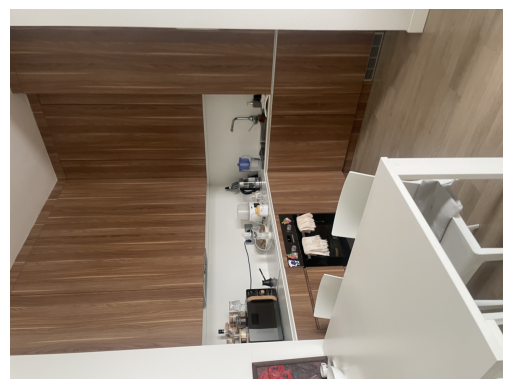

In [8]:
first_folder = folders[0]  # Getting the name of the first subfolder
first_image_path = categories_images[first_folder][0]  # Getting the path to the first image in the first subfolder
print(first_image_path) # Output the path to the image

first_image = plt.imread(first_image_path)  
plt.imshow(first_image)  
plt.axis('off')  
plt.show() # Show the image 

## Image match search

### 1. Using Nearest Neighbors

C:\Users\totmi\anaconda\envs\anyloc\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\totmi\anaconda\envs\anyloc\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Processing .ipynb_checkpoints: 0it [00:00, ?it/s]
Processing Wardrobe: 100%|██████████| 45/45 [00:03<00:00, 12.56it/s]
Processing .ipynb_checkpoints: 0it [00:00, ?it/s]
Processing Wardrobe: 100%|██████████| 6/6 [00:00<00:00, 13.48it/s]



Top-5 matches for the image 'Bathroom\pr_bathroom17.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bathroom           | pr_bathroom17.jpg              | Bathroom         | pr_bathroom30.jpg              | 0.072172 |
|    2 | Bathroom           | pr_bathroom17.jpg              | Bathroom         | pr_bathroom49.jpg              | 0.074975 |
|    3 | Bathroom           | pr_bathroom17.jpg              | Bathroom         | pr_bathroom25.jpg              | 0.078150 |
|    4 | Bathroom           | pr_bathroom17.jpg              | Bathroom         | pr_bathroom27.jpg              | 0.083513 |
|    5 | Bathroom           | pr_bathroom17.jpg              | Bathroom         | pr_bathroom15.jpg       

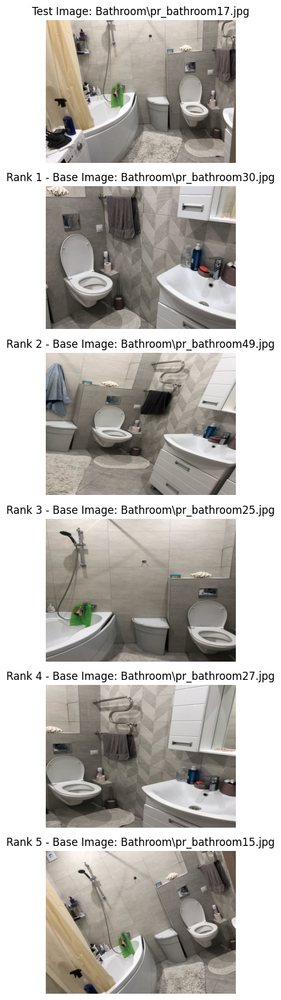


Top-5 matches for the image 'Bathroom\pr_bathroom33.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bathroom           | pr_bathroom33.jpg              | Bathroom         | pr_bathroom22.jpg              | 0.076293 |
|    2 | Bathroom           | pr_bathroom33.jpg              | Bathroom         | pr_bathroom25.jpg              | 0.079417 |
|    3 | Bathroom           | pr_bathroom33.jpg              | Bathroom         | pr_bathroom30.jpg              | 0.081534 |
|    4 | Bathroom           | pr_bathroom33.jpg              | Bathroom         | pr_bathroom41.jpg              | 0.087944 |
|    5 | Bathroom           | pr_bathroom33.jpg              | Bathroom         | pr_bathroom15.jpg       

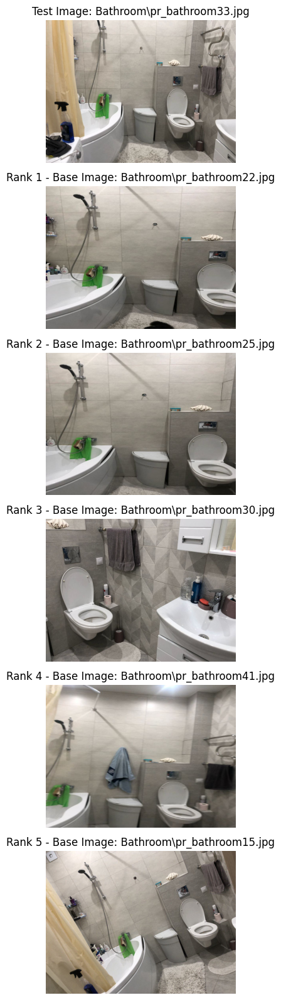


Top-5 matches for the image 'Bathroom\pr_bathroom331.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bathroom           | pr_bathroom331.jpg             | Bathroom         | pr_bathroom34.jpg              | 0.082908 |
|    2 | Bathroom           | pr_bathroom331.jpg             | Bathroom         | pr_bathroom46.jpg              | 0.119838 |
|    3 | Bathroom           | pr_bathroom331.jpg             | Bathroom         | pr_bathroom42.jpg              | 0.133818 |
|    4 | Bathroom           | pr_bathroom331.jpg             | Bathroom         | pr_bathroom37.jpg              | 0.144129 |
|    5 | Bathroom           | pr_bathroom331.jpg             | Bathroom         | pr_bathroom20.jpg      

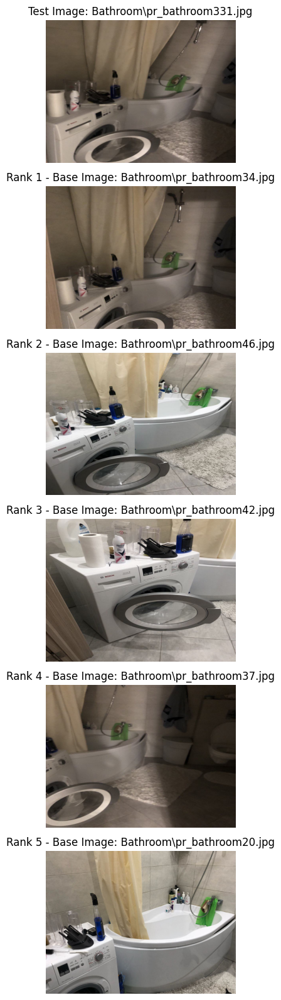


Top-5 matches for the image 'Bathroom\pr_bathroom4.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bathroom           | pr_bathroom4.jpg               | Bathroom         | pr_bathroom8.jpg               | 0.086344 |
|    2 | Bathroom           | pr_bathroom4.jpg               | Bathroom         | pr_bathroom38.jpg              | 0.104042 |
|    3 | Bathroom           | pr_bathroom4.jpg               | Bathroom         | pr_bathroom3.jpg               | 0.117090 |
|    4 | Bathroom           | pr_bathroom4.jpg               | Bathroom         | pr_bathroom25.jpg              | 0.126869 |
|    5 | Bathroom           | pr_bathroom4.jpg               | Bathroom         | pr_bathroom20.jpg        

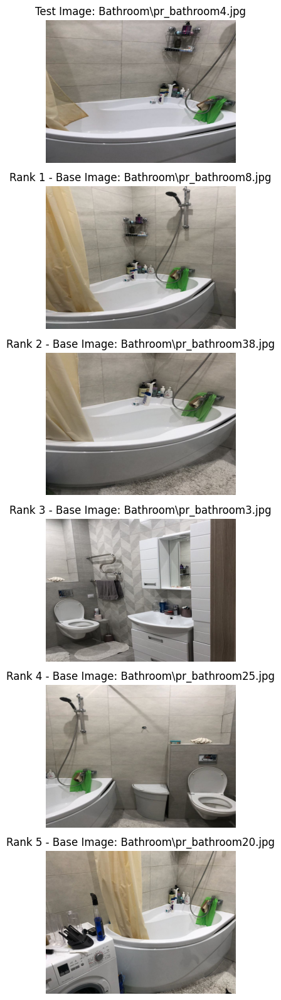


Top-5 matches for the image 'Bathroom\pr_bathroom50.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bathroom           | pr_bathroom50.jpg              | Bathroom         | pr_bathroom3.jpg               | 0.065487 |
|    2 | Bathroom           | pr_bathroom50.jpg              | Bathroom         | pr_bathroom27.jpg              | 0.067530 |
|    3 | Bathroom           | pr_bathroom50.jpg              | Bathroom         | pr_bathroom49.jpg              | 0.078734 |
|    4 | Bathroom           | pr_bathroom50.jpg              | Bathroom         | pr_bathroom47.jpg              | 0.084451 |
|    5 | Bathroom           | pr_bathroom50.jpg              | Bathroom         | pr_bathroom23.jpg       

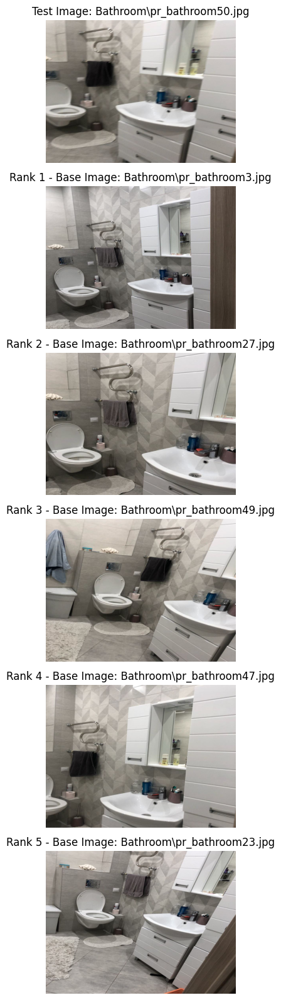


Top-5 matches for the image 'Bathroom\pr_bathroom9.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bathroom           | pr_bathroom9.jpg               | Bathroom         | pr_bathroom32.jpg              | 0.108042 |
|    2 | Bathroom           | pr_bathroom9.jpg               | Bathroom         | pr_bathroom20.jpg              | 0.111651 |
|    3 | Bathroom           | pr_bathroom9.jpg               | Bathroom         | pr_bathroom46.jpg              | 0.115873 |
|    4 | Bathroom           | pr_bathroom9.jpg               | Bathroom         | pr_bathroom15.jpg              | 0.135586 |
|    5 | Bathroom           | pr_bathroom9.jpg               | Bathroom         | pr_bathroom21.jpg        

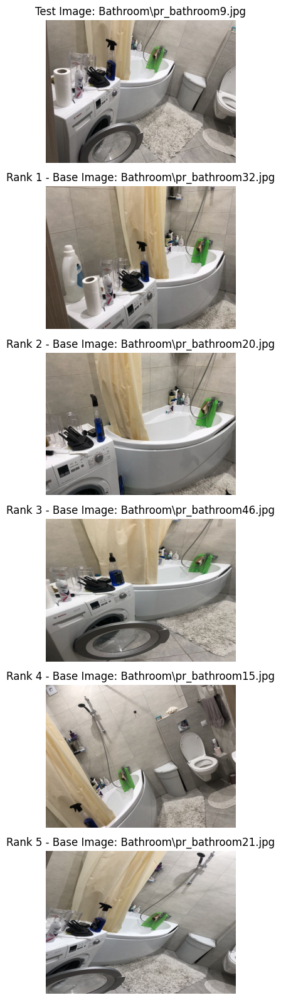


Top-5 matches for the image 'Bedroom\pr_bedroom1.JPG':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bedroom            | pr_bedroom1.JPG                | Bedroom          | pr_bedroom2.JPG                | 0.118800 |
|    2 | Bedroom            | pr_bedroom1.JPG                | Living_room      | pr_livingr40.JPG               | 0.204617 |
|    3 | Bedroom            | pr_bedroom1.JPG                | Bedroom          | pr_bedroom3.JPG                | 0.207749 |
|    4 | Bedroom            | pr_bedroom1.JPG                | Bedroom          | pr_bedroom11.JPG               | 0.224310 |
|    5 | Bedroom            | pr_bedroom1.JPG                | Living_room      | pr_livingr36.JPG           

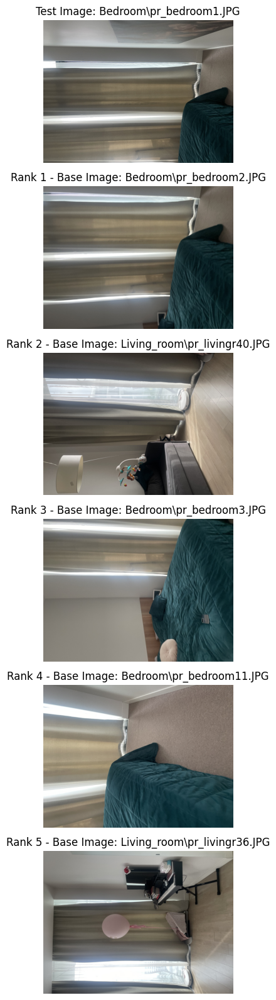


Top-5 matches for the image 'Bedroom\pr_bedroom17.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bedroom            | pr_bedroom17.jpg               | Bedroom          | pr_bedroom28.jpg               | 0.069379 |
|    2 | Bedroom            | pr_bedroom17.jpg               | Bedroom          | pr_bedroom22.jpg               | 0.075054 |
|    3 | Bedroom            | pr_bedroom17.jpg               | Bedroom          | pr_bedroom26.jpg               | 0.078596 |
|    4 | Bedroom            | pr_bedroom17.jpg               | Bedroom          | pr_bedroom39.jpg               | 0.079593 |
|    5 | Bedroom            | pr_bedroom17.jpg               | Bedroom          | pr_bedroom32.jpg          

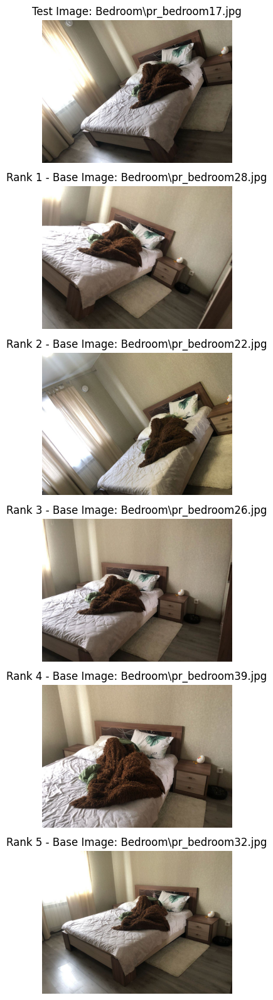


Top-5 matches for the image 'Bedroom\pr_bedroom27.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bedroom            | pr_bedroom27.jpg               | Bedroom          | pr_bedroom36.jpg               | 0.062962 |
|    2 | Bedroom            | pr_bedroom27.jpg               | Bedroom          | pr_bedroom24.jpg               | 0.105081 |
|    3 | Bedroom            | pr_bedroom27.jpg               | Bedroom          | pr_bedroom39.jpg               | 0.121151 |
|    4 | Bedroom            | pr_bedroom27.jpg               | Bedroom          | pr_bedroom25.jpg               | 0.121702 |
|    5 | Bedroom            | pr_bedroom27.jpg               | Bedroom          | pr_bedroom16.jpg          

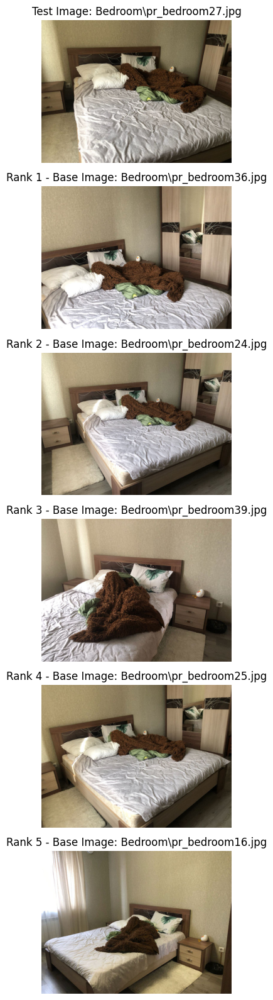


Top-5 matches for the image 'Bedroom\pr_bedroom45.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bedroom            | pr_bedroom45.jpg               | Bedroom          | pr_bedroom46.jpg               | 0.069151 |
|    2 | Bedroom            | pr_bedroom45.jpg               | Bedroom          | pr_bedroom41.jpg               | 0.125195 |
|    3 | Bedroom            | pr_bedroom45.jpg               | Bedroom          | pr_bedroom32.jpg               | 0.130631 |
|    4 | Bedroom            | pr_bedroom45.jpg               | Bedroom          | pr_bedroom42.jpg               | 0.148119 |
|    5 | Bedroom            | pr_bedroom45.jpg               | Bedroom          | pr_bedroom35.jpg          

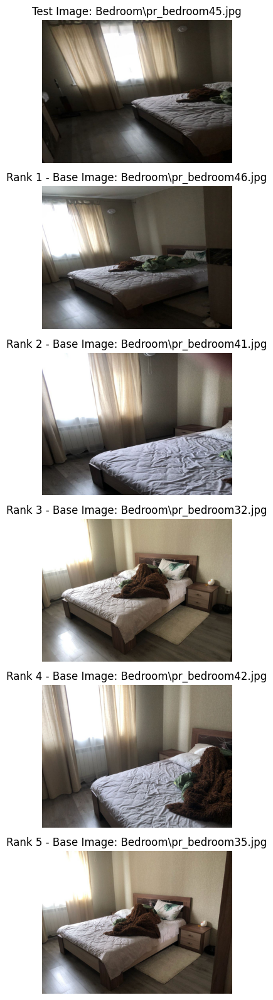


Top-5 matches for the image 'Bedroom\pr_bedroom450.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bedroom            | pr_bedroom450.jpg              | Bedroom          | pr_bedroom41.jpg               | 0.081079 |
|    2 | Bedroom            | pr_bedroom450.jpg              | Bedroom          | pr_bedroom46.jpg               | 0.095164 |
|    3 | Bedroom            | pr_bedroom450.jpg              | Bathroom         | pr_bathroom18.jpg              | 0.102402 |
|    4 | Bedroom            | pr_bedroom450.jpg              | Bedroom          | pr_bedroom34.jpg               | 0.102402 |
|    5 | Bedroom            | pr_bedroom450.jpg              | Living_room      | pr_livingr9.jpg          

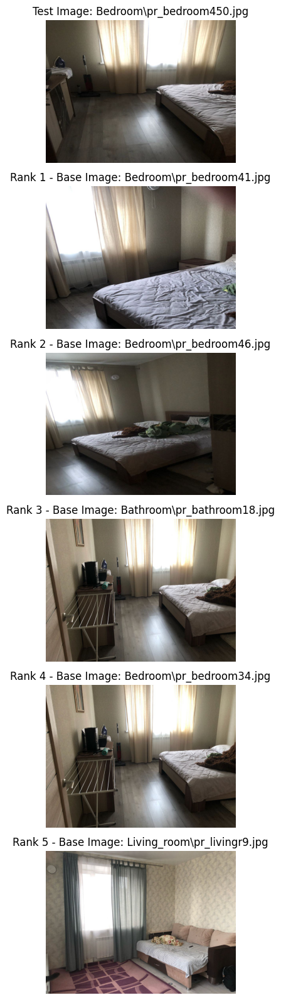


Top-5 matches for the image 'Bedroom\pr_bedroom6.JPG':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Bedroom            | pr_bedroom6.JPG                | Bedroom          | pr_bedroom5.JPG                | 0.087958 |
|    2 | Bedroom            | pr_bedroom6.JPG                | Bedroom          | pr_bedroom7.JPG                | 0.093863 |
|    3 | Bedroom            | pr_bedroom6.JPG                | Bedroom          | pr_bedroom4.JPG                | 0.134463 |
|    4 | Bedroom            | pr_bedroom6.JPG                | Bedroom          | pr_bedroom8.JPG                | 0.157727 |
|    5 | Bedroom            | pr_bedroom6.JPG                | Bedroom          | pr_bedroom14.JPG           

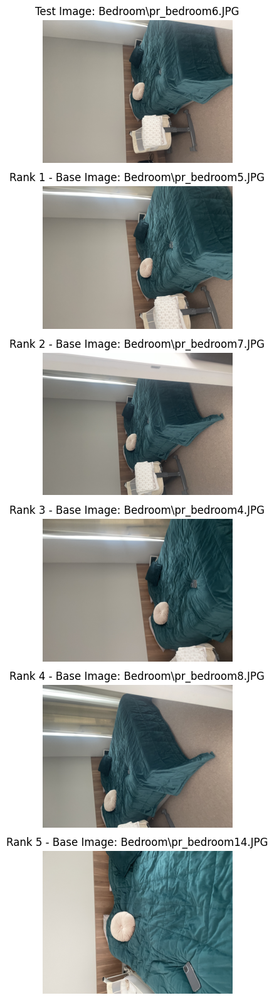


Top-5 matches for the image 'Kitchen\pr_kitchen11.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Kitchen            | pr_kitchen11.jpg               | Kitchen          | pr_kitchen9.jpg                | 0.028600 |
|    2 | Kitchen            | pr_kitchen11.jpg               | Kitchen          | pr_kitchen29.jpg               | 0.035939 |
|    3 | Kitchen            | pr_kitchen11.jpg               | Kitchen          | pr_kitchen24.jpg               | 0.039266 |
|    4 | Kitchen            | pr_kitchen11.jpg               | Kitchen          | pr_kitchen19.jpg               | 0.044477 |
|    5 | Kitchen            | pr_kitchen11.jpg               | Kitchen          | pr_kitchen31.jpg          

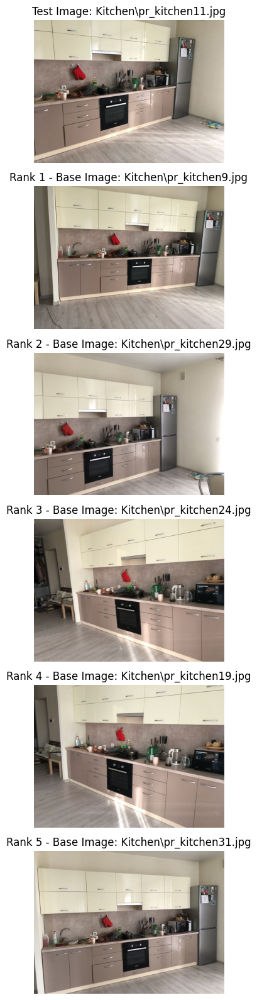


Top-5 matches for the image 'Kitchen\pr_kitchen15.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Kitchen            | pr_kitchen15.jpg               | Kitchen          | pr_kitchen14.jpg               | 0.047578 |
|    2 | Kitchen            | pr_kitchen15.jpg               | Kitchen          | pr_kitchen17.jpg               | 0.061067 |
|    3 | Kitchen            | pr_kitchen15.jpg               | Kitchen          | pr_kitchen8.jpg                | 0.072111 |
|    4 | Kitchen            | pr_kitchen15.jpg               | Kitchen          | pr_kitchen33.jpg               | 0.079399 |
|    5 | Kitchen            | pr_kitchen15.jpg               | Kitchen          | pr_kitchen32.jpg          

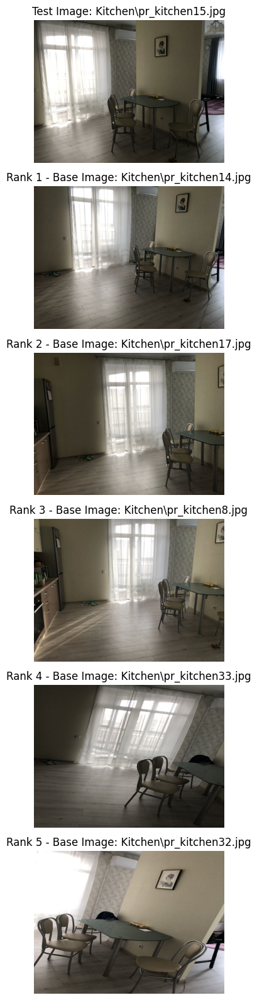


Top-5 matches for the image 'Kitchen\pr_kitchen35.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | Kitchen            | pr_kitchen35.jpg               | Kitchen          | pr_kitchen27.jpg               | 0.125304 |
|    2 | Kitchen            | pr_kitchen35.jpg               | Kitchen          | pr_kitchen18.jpg               | 0.131193 |
|    3 | Kitchen            | pr_kitchen35.jpg               | Kitchen          | pr_kitchen22.jpg               | 0.146818 |
|    4 | Kitchen            | pr_kitchen35.jpg               | Kitchen          | pr_kitchen28.jpg               | 0.153157 |
|    5 | Kitchen            | pr_kitchen35.jpg               | Kitchen          | pr_kitchen32.jpg          

In [ ]:
# Load the pre-trained ResNet model
model = models.resnet50(pretrained=True)
model.eval()

# Removing the last layers for classification
model = torch.nn.Sequential(*(list(model.children())[:-1]))

# Feature extraction
def extract_features(image_tensor):
    with torch.no_grad():
        features = model(image_tensor)
    features = features.squeeze().numpy()
    return features

# Loading, transforming and extracting features
# If we have an extra folder, just ignore it
def process_image(image_path):
    if '.ipynb_checkpoints' in image_path:
        return None
    
    # Download images
    image = Image.open(image_path)
    
    # Image transformation to tensor and normalization
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    
    # Applying transformations and extracting features
    input_tensor = preprocess(image)
    input_batch = input_tensor.unsqueeze(0)  # Add package dimensions for compatibility with the model.
    features = extract_features(input_batch)
    
    return features

# Prepare images from base database
database_features = []
database_labels = []
for folder in os.listdir(base_directory):
    folder_path = os.path.join(base_directory, folder)
    for file in tqdm(os.listdir(folder_path), desc=f'Processing {folder}'):
        file_path = os.path.join(folder_path, file)
        features = process_image(file_path)
        if features is not None:
            database_features.append(features)
            database_labels.append(os.path.join(folder, file))

# Prepare images from test database
test_features = []
test_labels = []
for folder in os.listdir(test_directory):
    folder_path = os.path.join(test_directory, folder)
    for file in tqdm(os.listdir(folder_path), desc=f'Processing {folder}'):
        file_path = os.path.join(folder_path, file)
        features = process_image(file_path)
        if features is not None:
            test_features.append(features)
            test_labels.append(os.path.join(folder, file))

# Image Matching using Nearest Neighbors
def compare_images_nn(query_features, database_features, database_labels, k=5):
    nn = NearestNeighbors(n_neighbors=k, metric='cosine')
    nn.fit(database_features)
    distances, indices = nn.kneighbors([query_features], n_neighbors=k)
    return distances, indices

# Calculate the accuracy to see if the model found the right image from the right class while compared test image with base
total_correct_matches = 0
total_queries = len(test_labels)

for i, (query_features, query_label) in enumerate(zip(test_features, test_labels)):
    distances, indices = compare_images_nn(query_features, database_features, database_labels)
    # Make a table to show the results
    print(f"\nTop-5 matches for the image '{query_label}':")
    print("------------------------------------------------------------------------------------------------------")
    print("| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Distance |")
    print("------------------------------------------------------------------------------------------------------")
    for j, idx in enumerate(indices[0]):
        base_image_folder, base_image_name = os.path.split(database_labels[idx])
        test_image_folder, test_image_name = os.path.split(query_label)
        print(f"|  {j+1:3d} | {test_image_folder:<18} | {test_image_name:<30} | {base_image_folder:<16} | {base_image_name:<30} | {distances[0][j]:8.6f} |")
    
    # Calculate accuracy for each image of the test dataset
    accuracy = 0
    if os.path.split(query_label)[0] == os.path.split(database_labels[indices[0][0]])[0]:
        accuracy = 100
    
    total_correct_matches += accuracy
    print(f"\nAccuracy of correct matches: {accuracy:.2f}%\n")

    # Display images
    fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(8, 16))
    
    # Display the test image
    test_image_path = os.path.join(test_directory, query_label)
    test_image = mpimg.imread(test_image_path)
    axes[0].imshow(test_image)
    axes[0].set_title(f"Test Image: {query_label}")
    axes[0].axis('off')

    # Display the five most similar images from the base database
    for k, idx in enumerate(indices[0]):
        base_image_path = os.path.join(base_directory, database_labels[idx])
        base_image = mpimg.imread(base_image_path)
        axes[k+1].imshow(base_image)
        axes[k+1].set_title(f"Rank {k+1} - Base Image: {database_labels[idx]}")
        axes[k+1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Overall accuracy across all images
total_accuracy = total_correct_matches / total_queries
print(f"Overall accuracy using Nearest Neighbors: {total_accuracy:.2f}%")

### 2. Using Correspondence to other classes

In [ ]:
# Image Matching using Correspondence to other classes
def compare_images_correspondence(query_features, database_features, database_labels, test_label, k=5):
    similarities = cosine_similarity([query_features], database_features)
    indices = similarities.argsort()[0][-k:][::-1]
    
    # Calculating the accuracy of correspondence matches with other classes
    correct_matches = 0
    for idx in indices:
        base_image_folder, _ = os.path.split(database_labels[idx])
        if base_image_folder == test_label:
            correct_matches += 1
    
    accuracy = correct_matches / k * 100
    return indices, accuracy

# Comparison with test_images
total_correct_matches = 0
total_queries = len(test_labels)

for i, (query_features, query_label) in enumerate(zip(test_features, test_labels)):
    indices, accuracy = compare_images_correspondence(query_features, database_features, database_labels, os.path.split(query_label)[0])
    total_correct_matches += accuracy
    # Also beatiful result
    print(f"\nTop-5 matches for the image '{query_label}':")
    print("------------------------------------------------------------------------------------------------------")
    print("| Rank | Test Image Folder | Test Image                    | Base Image Folder | Base Image                     | Similarity |")
    print("------------------------------------------------------------------------------------------------------")
    for j, idx in enumerate(indices):
        base_image_folder, base_image_name = os.path.split(database_labels[idx])  # Разделение пути на папку и имя файла
        test_image_folder, test_image_name = os.path.split(query_label)  # Разделение пути на папку и имя файла
        similarity = cosine_similarity([query_features], [database_features[idx]])[0][0]
        print(f"|  {j+1:3d} | {test_image_folder:<18} | {test_image_name:<30} | {base_image_folder:<16} | {base_image_name:<30} | {similarity:10.6f} |")
    
    print(f"\nAccuracy of correct matches by correspondence to other classes: {accuracy:.2f}%\n")  # Вывод точности совпадений
    
    # Image output
    fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(8, 16))
    
    # Image output from the test dataset
    test_image_path = os.path.join(test_directory, query_label)
    test_image = mpimg.imread(test_image_path)
    axes[0].imshow(test_image)
    axes[0].set_title(f"Test Image: {query_label}")
    axes[0].axis('off')

    # Output of the five closest images from the base dataset
    for k, idx in enumerate(indices):
        base_image_path = os.path.join(base_directory, database_labels[idx])
        base_image = mpimg.imread(base_image_path)
        axes[k+1].imshow(base_image)
        axes[k+1].set_title(f"Rank {k+1} - Base Image: {database_labels[idx]}")
        axes[k+1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Calculate total accuracy
total_accuracy = total_correct_matches / total_queries
print(f"Total accuracy using Correspondence to other classes: {total_accuracy:.2f}%")

Done